<h1 style="text-align:center">
   Tarea de Machine Learning 
</h1>

<h2 style="text-align:center">
Olga Turkeeva
</h2>

<hr>

**Pump it Up: Data Mining the Water Table
HOSTED BY DRIVENDATA**

Fuente de datos: https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/23/

Can you predict which water pumps are faulty?

Using data from Taarifa and the Tanzanian Ministry of Water, can you predict which pumps are functional, which need some repairs, and which don't work at all? This is an intermediate-level practice competition. Predict one of these three classes based on a number of variables about what kind of pump is operating, when it was installed, and how it is managed. A smart understanding of which waterpoints will fail can improve maintenance operations and ensure that clean, potable water is available to communities across Tanzania.


Your goal is to predict the operating condition of a waterpoint for each record in the dataset. You are provided the following set of information about the waterpoints:

- amount_tsh - Total static head (amount water available to waterpoint);
- date_recorded - The date the row was entered
- funder - Who funded the well
- gps_height - Altitude of the well
- installer - Organization that installed the well
- longitude - GPS coordinate
- latitude - GPS coordinate
- wpt_name - Name of the waterpoint if there is one
- num_private -
- basin - Geographic water basin
- subvillage - Geographic location
- region - Geographic location
- region_code - Geographic location (coded)
- district_code - Geographic location (coded)
- lga - Geographic location
- ward - Geographic location
- population - Population around the well
- public_meeting - True/False
- recorded_by - Group entering this row of data
- scheme_management - Who operates the waterpoint
- scheme_name - Who operates the waterpoint
- permit - If the waterpoint is permitted
- construction_year - Year the waterpoint was constructed
- extraction_type - The kind of extraction the waterpoint uses
- extraction_type_group - The kind of extraction the waterpoint uses
- extraction_type_class - The kind of extraction the waterpoint uses
- management - How the waterpoint is managed
- management_group - How the waterpoint is managed
- payment - What the water costs
- payment_type - What the water costs
- water_quality - The quality of the water
- quality_group - The quality of the water
- quantity - The quantity of water
- quantity_group - The quantity of water
- source - The source of the water
- source_type - The source of the water
- source_class - The source of the water
- waterpoint_type - The kind of waterpoint
- waterpoint_type_group - The kind of waterpoint

In [1]:
# Tratamiento de datos
import pandas as pd
from pandas_profiling import ProfileReport
from pandas.api.types import is_string_dtype, is_numeric_dtype,is_object_dtype
import numpy as np


# Gráficos
import matplotlib.pyplot as plt
from matplotlib.pyplot import *
import seaborn as sns

# Preprocesado y modelado
from sklearn import tree
from sklearn.metrics import accuracy_score, auc, confusion_matrix, f1_score, precision_score, recall_score, roc_curve
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.pipeline import make_pipeline,Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split,RandomizedSearchCV,GridSearchCV
from sklearn.ensemble import RandomForestClassifier,StackingClassifier
import xgboost as xgb
#from catboost import CatBoostClassifier

# Varios
import itertools
import scipy.stats as ss
import random
#Figures inline and set visualization style
%matplotlib inline
sns.set()

# Configuración warnings
import warnings
warnings.filterwarnings('ignore')

In [ ]:
#import test and train datasets
df_bombas=pd.read_csv('TrainingSetValues.csv', sep=',')
df_labels=pd.read_csv('TrainingSetLabels.csv', sep=',')
df_bombas_test=pd.read_csv('TestSetValues.csv', sep=',')

df_bombas.set_index(['id'], inplace=True)
df_labels.set_index(['id'], inplace=True)
df_bombas_test.set_index(['id'], inplace=True)

In [ ]:
# Dimensiones del dataset con la variable objetivo
df=pd.merge(df_bombas,df_labels,on='id')
df.shape

(59400, 40)

### 1. EDA (Análisis exploratorio)

In [ ]:
pd.set_option('display.max_columns', None)
df.head()

,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,VWC,NaN,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional


In [ ]:
# Tipo de cada columna
df.info() #muchas variables categoricas, hay missings

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59400 entries, 69572 to 26348
Data columns (total 40 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   amount_tsh             59400 non-null  float64
 1   date_recorded          59400 non-null  object 
 2   funder                 55765 non-null  object 
 3   gps_height             59400 non-null  int64  
 4   installer              55745 non-null  object 
 5   longitude              59400 non-null  float64
 6   latitude               59400 non-null  float64
 7   wpt_name               59400 non-null  object 
 8   num_private            59400 non-null  int64  
 9   basin                  59400 non-null  object 
 10  subvillage             59029 non-null  object 
 11  region                 59400 non-null  object 
 12  region_code            59400 non-null  int64  
 13  district_code          59400 non-null  int64  
 14  lga                    59400 non-null  object 
 15

In [ ]:
# Número de datos ausentes por variable
df.isna().sum().sort_values(ascending=False)

scheme_name              28166
scheme_management         3877
installer                 3655
funder                    3635
public_meeting            3334
permit                    3056
subvillage                 371
water_quality                0
extraction_type_class        0
management                   0
management_group             0
payment                      0
payment_type                 0
quantity                     0
quality_group                0
extraction_type              0
quantity_group               0
source                       0
source_type                  0
source_class                 0
waterpoint_type              0
waterpoint_type_group        0
extraction_type_group        0
amount_tsh                   0
construction_year            0
date_recorded                0
recorded_by                  0
population                   0
ward                         0
lga                          0
district_code                0
region_code                  0
region  

Uso la librería **pandas_profiling** para generar un ProfileReport. Este reporte provee detalles del dataset tales como la cantidad de variables, los datos nulos, total en memoria, tipos de variables, etc. Más aún, provee detalles de cada variable del dataset tal como la correlación, la media, valores nulos, cardinalidad, entre otros que veremos a continuación.
- Si presionamos en “Toggle details” obtenemos aún más detalles de la variable, tales como datos estadísticos, histogramas, valores extremos, valores comúnes:

In [ ]:
profile = ProfileReport(df, title="EDA profile", html={'style': {'full_width': True}})
profile

Summarize dataset:   0%|          | 0/54 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

-------------------------------------------------------------------------------
**1.1 Analis general de variables**
---------------------------------------------------------------
El Dataframe inicial tiene 59400 filas y 40 variables: 10 numericas, 28 categoricas y 2 booleanas. No hay filas duplicadas y el porcentaje de valores faltantes es igual a 1.9%.

La frequencia de la **variable respuesta** es: 
- functional - 32259	- 54.3%
- non functional	- 22824 -38.4%
- functional needs repair - 	4317 -  7.3%
 
............................................................................
- Variable **recorded_by** es constante. Tiene solo una categoria => a eliminar

............................................................................

**Ceros:**
- Variable **amount_tsh** tiene 41639 (70.1%) ceros y tiene valores muy altos => analisar los outliers 
- Variable **num_private** tiene 58643 (98.7%) ceros => a eliminar
- Variable **construction_year** and **gps_height** tienen 34% de ceros y estan correlacionados(66%) => a analizar

..............................................................

**Cardinalidad alta:**
- Variable **wpt_name** tiene 37400 valores distintos (63%)
- Variable **subvillage** tiene 19287 valores distintos (32%)
- Variable **funder** tiene 1897 valores distintos
- Variable **installer** tiene 2145 valores distintos
- Variable **lga** tiene 125 valores distintos
- Variable **ward** tiene 2092 valores distintos
- Variable **scheme_name** tiene 2696 valores distintos


## Variables numercias

In [ ]:
# Variables numéricas
df.select_dtypes(include=['float64', 'int64']).describe().round()

,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year
count,59400.0,59400.0,59400.0,59400.0,59400.0,59400.0,59400.0,59400.0,59400.0
mean,318.0,668.0,34.0,-6.0,0.0,15.0,6.0,180.0,1301.0
std,2998.0,693.0,7.0,3.0,12.0,18.0,10.0,471.0,952.0
min,0.0,-90.0,0.0,-12.0,0.0,1.0,0.0,0.0,0.0
25%,0.0,0.0,33.0,-9.0,0.0,5.0,2.0,0.0,0.0
50%,0.0,369.0,35.0,-5.0,0.0,12.0,3.0,25.0,1986.0
75%,20.0,1319.0,37.0,-3.0,0.0,17.0,5.0,215.0,2004.0
max,350000.0,2770.0,40.0,-0.0,1776.0,99.0,80.0,30500.0,2013.0


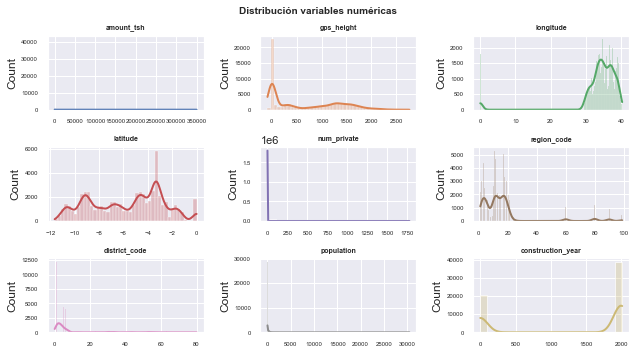

In [ ]:
# Gráfico de distribución para cada variable numérica
# Tarda más de 10 min
'''
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(9, 5))
axes = axes.flat
columnas_numeric = df.select_dtypes(include=['float64', 'int64']).columns

for i, colum in enumerate(columnas_numeric):
    sns.histplot(
        data    = df,
        x       = colum,
        stat    = "count",
        kde     = True,
        color   = (list(plt.rcParams['axes.prop_cycle'])*2)[i]["color"],
        line_kws= {'linewidth': 2},
        alpha   = 0.3,
        ax      = axes[i]
    )
    axes[i].set_title(colum, fontsize = 7, fontweight = "bold")
    axes[i].tick_params(labelsize = 6)
    axes[i].set_xlabel("")
    
    
fig.tight_layout()
plt.subplots_adjust(top = 0.9)
fig.suptitle('Distribución variables numéricas', fontsize = 10, fontweight = "bold");
'''

## OUTLIERS

<AxesSubplot:xlabel='population'>

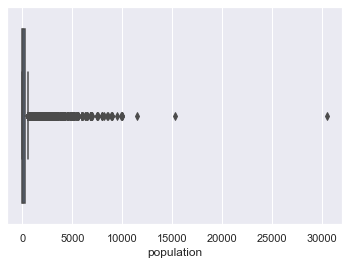

In [ ]:
#Variable "population"
sns.boxplot(df['population'])

<AxesSubplot:xlabel='gps_height'>

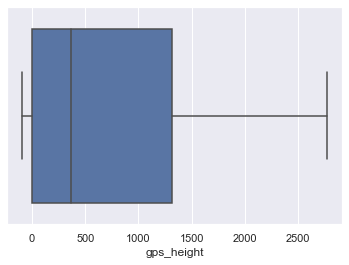

In [ ]:
#Variable "gps_height"
sns.boxplot(df['gps_height'])
#sin outliers

<AxesSubplot:xlabel='amount_tsh'>

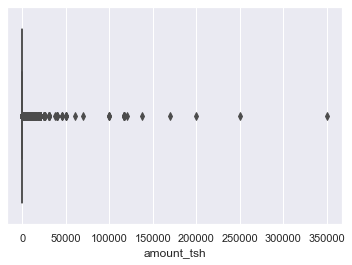

In [ ]:
#Variable "amount_tsh"
sns.boxplot(df['amount_tsh'])
#70% son ceros y hay muchos outliers

**1.2 Correlaciones**

Primero miramos las correlaciones entre **variables numercias** usando la matriz de correlacion de Pearson y luego entre variables categoricas usando la matriz de VCramer. He intentado usar el coeficiente de Phik para sacr la matriz de correlaciones entre categoricas y numericas pero no fue possible, se llena el CPU y memoria del procesador. 

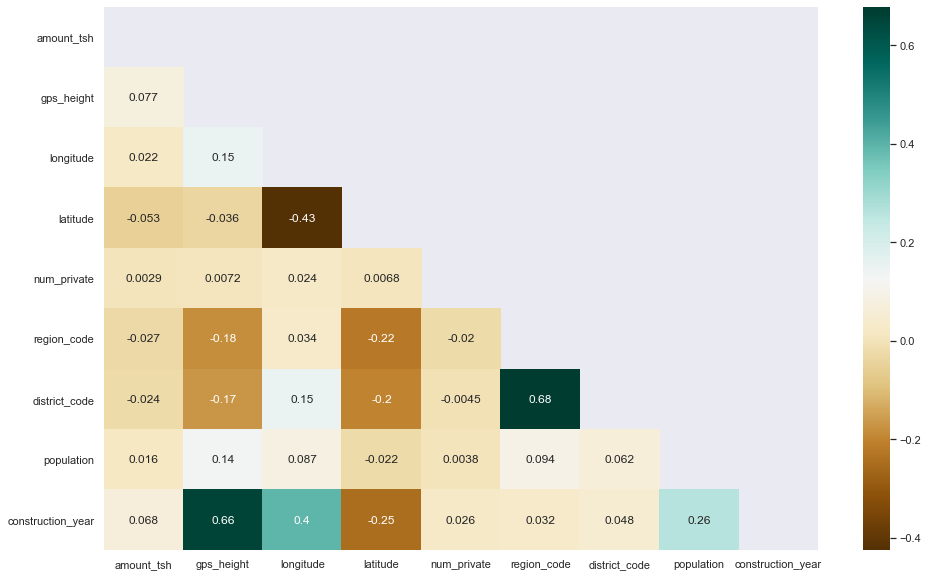

In [ ]:
#using Pearson Correlation
pd.options.display.float_format ='{:,.2f}'.format
plt.figure(figsize=(16,10))
corr_num=df.corr()
mask=np.triu(np.ones(corr_num.shape)).astype(np.bool)
sns.heatmap(corr_num, mask=mask, annot=True, cmap=plt.cm.BrBG)
plt.show()

No hay correlaciones fuertes. Llaman attencion las relaciones entre: 
- **construction_year** y **gps_height** (ambas tienen 34% de missigns corresponidentes uno a otro)

Vemos ahora las correlaciones entre **variables categoricas con la matriz de VCramer**

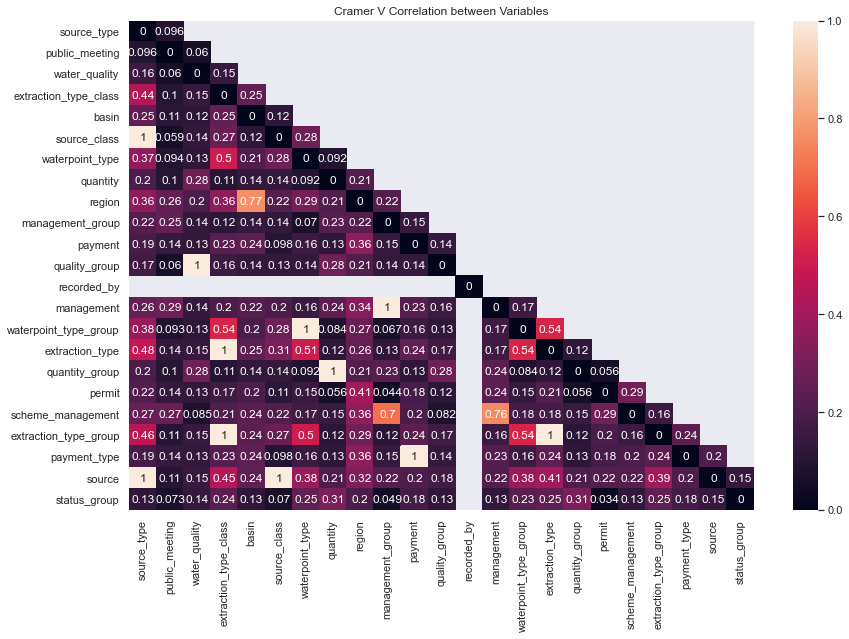

In [ ]:
def cramers_corrected_stat(confusion_matrix):
    chi2 = ss.chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r,k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))    
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))


cols = ["source_type", "public_meeting", "water_quality", 'extraction_type_class', 'basin', 'source_class', 'waterpoint_type', 'quantity',
       'region', 'management_group','payment', 'quality_group', 'recorded_by', 'management', 'waterpoint_type_group', 'extraction_type',
       'quantity_group', 'permit', 'scheme_management', 'extraction_type_group', 'payment_type', 'source','status_group']
corrM = np.zeros((len(cols),len(cols)))
# there's probably a nice pandas way to do this
for col1, col2 in itertools.combinations(cols, 2):
    idx1, idx2 = cols.index(col1), cols.index(col2)
    corrM[idx1, idx2] = cramers_corrected_stat(pd.crosstab(df[col1], df[col2]))
    corrM[idx2, idx1] = corrM[idx1, idx2]

corr = pd.DataFrame(corrM, index=cols, columns=cols)
lower_tri = corr.where(np.tril(np.ones(corr.shape),k=1).astype(np.bool))
fig, ax = plt.subplots(figsize=(14, 9))
ax = sns.heatmap(lower_tri, annot=True, ax=ax); ax.set_title("Cramer V Correlation between Variables");
    


In [ ]:
corr[['status_group']].sort_values(by = 'status_group',ascending = False).style.background_gradient()

,status_group
quantity,0.309136
quantity_group,0.309136
waterpoint_type,0.250228
extraction_type,0.248427
extraction_type_group,0.246901
extraction_type_class,0.241339
waterpoint_type_group,0.226691
region,0.200059
payment_type,0.182430
payment,0.182430


In [ ]:
#scheme_management y management son muy parecidos, pero la correlacion entre ellos es de 76% (menos de 90%), guardo 2 variables 
print(df['management'].value_counts())
print(df['scheme_management'].value_counts())

vwc                 40507
wug                  6515
water board          2933
wua                  2535
private operator     1971
parastatal           1768
water authority       904
other                 844
company               685
unknown               561
other - school         99
trust                  78
Name: management, dtype: int64
VWC                 36793
WUG                  5206
Water authority      3153
WUA                  2883
Water Board          2748
Parastatal           1680
Private operator     1063
Company              1061
Other                 766
SWC                    97
Trust                  72
None                    1
Name: scheme_management, dtype: int64


En el grafico de Vcramer vemos la multicolinealidad:
- source - source_type - source_class
- waterpoint_type - waterpoint_type_group
- extraction_type_group - extraction_type_class  - extraction_type
- management - management_group - scheme_management
- payment - payment_type
- water_quality - quality_group
- quantity_group - quantity

Las variables mejor correlacionadas con la variable objetivo son: 
- quantity (o quantity_group)
- extraction_type_class (extraction_type, extraction_type_group)
- waterpoint_type(waterpoint_type_group)

Las variables peor correlacionadas con la variable objetivo:
- public_meeting
- source_class
- management_group
- permit

Las correlaciones entre **variables categoricas y numericas** vemos en la matriz de Phik en EDA Profile:
- region - region_code

In [ ]:
df[["region", "region_code"]].value_counts()
# vemos que hay regiones con varios codigos(por ejemplo Lindi tiene codigos 80,8,18) => guardo dos variables

region         region_code
Iringa         11             5294
Shinyanga      17             4956
Mbeya          12             4639
Kilimanjaro    3              4379
Morogoro       5              4006
Kagera         18             3316
Mwanza         19             3047
Arusha         2              3024
Kigoma         16             2816
Ruvuma         10             2640
Tanga          4              2513
Dodoma         1              2201
Singida        13             2093
Mara           20             1969
Tabora         14             1959
Rukwa          15             1808
Pwani          6              1609
Manyara        21             1583
Lindi          80             1238
Pwani          60             1025
Mtwara         90              917
Dar es Salaam  7               805
Mtwara         99              423
               9               390
Arusha         24              326
Lindi          8               300
Mwanza         17               55
Tanga          5            

**1.3 Missings**
- **funder** tiene 6.1% valores faltantes. 1897 categorias distintas. 	
- **installer** tiene 6.2% missing values. 2145 categorias distintas.
- **public_meeting** tiene 5.6% valores faltantes. Variable booleana(86% True,8.5& False)
- **scheme_management** tiene 6.5% valores faltantes. 12 categorias distintas.Valor "VWC" representa 61.9% de todos los valores.
- **scheme_name** tiene 47.4% valores faltantes. Tiene 2696 distintas y 47% de missings => a eliminar
- **permit** tiene 5.1% valores faltantes. Variable booleana (65.4% True,29.4% False) 
- **subvillage** tiene 0.6% valores faltantes. Tiene 19287 categorias distintas.


### 2. PRE PROCESADO 

In [ ]:
df_c = pd.concat([df_bombas,df_bombas_test])
df_c.shape

(74250, 39)

In [ ]:
#transformo la varible "date_recorded" en tres variables: año, mes y dia
df_c['month'] = pd.to_datetime(df_c['date_recorded']).dt.month.apply(str)
df_c['year'] = pd.to_datetime(df_c['date_recorded']).dt.year.apply(str)
df_c['day'] = pd.to_datetime(df_c['date_recorded']).dt.day.apply(str)

#paso las variables de las fechas a numéricas
df_c['month']=pd.to_numeric(df_c['month'])
df_c['year']=pd.to_numeric(df_c['year'])
df_c['day']=pd.to_numeric(df_c['day'])

#creo una variable de distancia a partir de la longitud y latitud 
df_c['dist']=np.sqrt(df_c['longitude']**2+df_c['latitude']**2)

In [ ]:
#elimino las variables:
df_c.drop(['date_recorded',
         'scheme_name', #47 % de missings
         'recorded_by', #es constante
         'num_private', #98.7% de ceros
                  
         #las variables con multicolinealidad y con peor correlacion con la VariableObj
         'source_type', 
         'waterpoint_type_group',
         'source_class',
         'quantity_group',
         'quality_group',
         'payment_type',
         'management_group',
         'extraction_type_group',
         'extraction_type_class'],
        axis=1, inplace=True)

In [ ]:
df_c.shape

(74250, 30)

**Imputacion de datos faltantes**

In [ ]:
df_c.isna().sum().sort_values(ascending=False)

scheme_management    4846
installer            4532
funder               4504
public_meeting       4155
permit               3793
subvillage            470
year                    0
month                   0
waterpoint_type         0
source                  0
quantity                0
water_quality           0
payment                 0
management              0
extraction_type         0
construction_year       0
day                     0
amount_tsh              0
population              0
ward                    0
lga                     0
district_code           0
region_code             0
region                  0
basin                   0
wpt_name                0
latitude                0
longitude               0
gps_height              0
dist                    0
dtype: int64

In [ ]:
#Creo columna para saber el porcentaje de missings original de cada muestra 
df_c['prop_missings']=df_c.isnull().mean(axis=1)

In [ ]:
# Completando valores faltantes de datos categóricos por valores aleatorios
col_null_random=['installer', 'funder', 'subvillage']
for c in col_null_random:
    random = np.random.choice(df_c[c])
    df_c[c] = df_c[c].fillna(random)

In [ ]:
# Completando valores faltantes de datos categóricos por mode
col_null_mode=['public_meeting', 'permit', 'scheme_management']
for c in col_null_mode:
    mode = df_c[c].mode()[0]
    df_c[c] = df_c[c].fillna(mode)

In [ ]:
# Controlando que no hayan valores faltantes
df_c.isnull().any().any()

False

**Transformacion de las variables categoricas**

In [ ]:
for column in df_c:
    if is_object_dtype(df_c[column]):
        print(column,len(df_c[column].unique()))

funder 2140
installer 2410
wpt_name 45684
basin 9
subvillage 21425
region 21
lga 125
ward 2098
scheme_management 12
extraction_type 18
management 12
payment 7
water_quality 8
quantity 5
source 10
waterpoint_type 7


In [ ]:
#Variables con muchas categorias transformo con las frecuencias:
CatFrecuencias=['funder','installer','wpt_name','subvillage','lga','ward']

for i in CatFrecuencias:
    frecuencia=df_c[i].value_counts().to_dict()
    df_c[i]=df_c[i].map(frecuencia)


In [ ]:
for column in df_c:
    if is_object_dtype(df_c[column]):
        print(column,len(df_c[column].unique()))

basin 9
region 21
scheme_management 12
extraction_type 18
management 12
payment 7
water_quality 8
quantity 5
source 10
waterpoint_type 7


In [ ]:
cat=['basin','region','extraction_type','management','payment','water_quality', \
      'quantity','source','waterpoint_type','scheme_management']

for j in cat:
    print(j)
    print(df_c[j].value_counts())

basin
Lake Victoria              12871
Pangani                    11143
Rufiji                      9987
Internal                    9642
Lake Tanganyika             8052
Wami / Ruvu                 7577
Lake Nyasa                  6332
Ruvuma / Southern Coast     5587
Lake Rukwa                  3059
Name: basin, dtype: int64
region
Iringa           6599
Shinyanga        6293
Mbeya            5758
Kilimanjaro      5494
Morogoro         5038
Kagera           4174
Arusha           4111
Mwanza           3897
Kigoma           3533
Pwani            3331
Ruvuma           3306
Tanga            3186
Dodoma           2779
Singida          2536
Tabora           2466
Mara             2451
Rukwa            2242
Mtwara           2144
Manyara          1972
Lindi            1920
Dar es Salaam    1020
Name: region, dtype: int64
extraction_type
gravity                      33263
nira/tanira                  10205
other                         8102
submersible                   5982
swn 80             

In [ ]:
#paso a dummies las variables categóricas restantes y compruebo que no haya variables 'object' ni valores faltantes
df_c=pd.get_dummies(df_c, drop_first=True)
print(np.mean(df_c.dtypes != object))
print(df_c.isnull().sum().sum())

1.0
0


In [ ]:
#separo las muestras despues el preprocesado
df_test=df_c.iloc[59400:, :]
df_train=df_c.iloc[:59400, :]
print(df_test.shape,df_train.shape)

(14850, 120) (59400, 120)


In [ ]:
df_train=pd.merge(df_train,df_labels,on='id')
df_train.head()
print(df_train.shape)

(59400, 121)


Para ver las correlaciones hago copia de df_train y paso la variable objetivo categorica a numerica

In [ ]:
df_train_merged = df_train.copy()

In [ ]:
df_train_merged.status_group.replace(('functional', 'non functional', 'functional needs repair'),(1,0,2),inplace=True)

In [ ]:
corr = abs(df_train_merged.corr())
corr[['status_group']].sort_values(by = 'status_group',ascending = False).style.background_gradient()

,status_group
status_group,1.000000
extraction_type_other,0.269685
waterpoint_type_other,0.268852
quantity_enough,0.203561
extraction_type_gravity,0.169980
water_quality_unknown,0.153653
waterpoint_type_communal standpipe,0.146638
payment_pay monthly,0.131293
ward,0.129870
lga,0.128313


In [ ]:
y=df_train['status_group']
df_train.drop('status_group', axis=1, inplace=True)
print(y.shape)

(59400,)


# 3. MODELOS

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(df_train, y, test_size = 0.2, random_state = 0, stratify=y)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(47520, 120)
(11880, 120)
(47520,)
(11880,)


### 3.1 Regresión Logística Multinomial

In [ ]:
log = make_pipeline(StandardScaler(), LogisticRegression(max_iter=500,verbose=1))
log.fit(X_train,y_train)
log.score(X_test, y_test)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   16.9s finished


0.7352693602693603

### 3.2 Modelo KNN

In [ ]:
knn = make_pipeline(StandardScaler(), KNeighborsClassifier(n_neighbors=5, metric='minkowski', p=2))
knn.fit(X_train,y_train)
knn.score(X_test, y_test) #mejor que el regresion logistica

0.7617003367003367

Los modelos basados en árboles no son modelos basados en la distancia y pueden manejar diferentes rangos de características. 
Por lo tanto, no es necesario escalar al modelar árboles.

### 3.3 Modelo Naive Bayes

In [ ]:
naive_bayes = GaussianNB()
naive_bayes.fit(X_train,y_train)
naive_bayes.score(X_test, y_test) #el peor resultado

0.5486531986531986

### 3.4 Decision tree classificacion

In [ ]:
tree=DecisionTreeClassifier(random_state=0)
tree.fit(X_train,y_train)
tree.score(X_test, y_test) #peor que en modelo KNN

0.7516835016835017

### 3.5 Random forest classificacion

In [ ]:
rf = RandomForestClassifier()
rf.fit(X_train, y_train)
rf.score(X_test, y_test)

0.8080808080808081

Hago una búsqueda de hiperparámetros con Randomsearch

In [ ]:
#Tarda más de 10 min

'''
rf_classifier = RandomForestClassifier()

grid_param = {'n_estimators': [100,200,250,300,500],
              'max_depth': [None,10,20,30],
              'criterion':['gini', 'entropy'],
              'bootstrap':[True,False]}

model_grid = RandomizedSearchCV(rf_classifier, 
                                    param_distributions=grid_param, 
                                    n_iter=15, 
                                    cv=5, 
                                    n_jobs=-1)

model_grid.fit(X_train,y_train)
best_accuracy = model_grid.best_score_
best_parameters = model_grid.best_params_
print("Best Accuracy: {:.2f} %".format(best_accuracy*100))
print("Best Parameters:", best_parameters)
'''

Best Accuracy: 80.80 %
Best Parameters: {'n_estimators': 300, 'max_depth': 20, 'criterion': 'entropy', 'bootstrap': True}


In [ ]:
rf_clf = RandomForestClassifier(n_estimators= 300, max_depth= 20, criterion='entropy', random_state=42, bootstrap = True)
rf_clf.fit(X_train,y_train)
rf_clf.score(X_test,y_test)

0.8142255892255892

### 3.6 XGBOOST

In [ ]:
xgb=xgb.XGBClassifier(objective='binary:logistic', missing=None, seed=0, n_jobs=6)
xgb.fit(X_train,y_train, verbose=True)
xgb.score(X_test,y_test)

[16:32:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


0.8025252525252525

### 3.7 CATBOOST

In [ ]:
cat = CatBoostClassifier()
cat.fit(X_train, y_train)
cat.score(X_test,y_test)

Learning rate set to 0.096348
0:	learn: 1.0330223	total: 245ms	remaining: 4m 4s
1:	learn: 0.9816610	total: 298ms	remaining: 2m 28s
2:	learn: 0.9402168	total: 348ms	remaining: 1m 55s
3:	learn: 0.9066517	total: 398ms	remaining: 1m 39s
4:	learn: 0.8771886	total: 456ms	remaining: 1m 30s
5:	learn: 0.8528370	total: 510ms	remaining: 1m 24s
6:	learn: 0.8316759	total: 598ms	remaining: 1m 24s
7:	learn: 0.8140600	total: 755ms	remaining: 1m 33s
8:	learn: 0.7986920	total: 810ms	remaining: 1m 29s
9:	learn: 0.7856653	total: 859ms	remaining: 1m 25s
10:	learn: 0.7729136	total: 912ms	remaining: 1m 21s
11:	learn: 0.7630953	total: 962ms	remaining: 1m 19s
12:	learn: 0.7527160	total: 1.02s	remaining: 1m 17s
13:	learn: 0.7443803	total: 1.09s	remaining: 1m 17s
14:	learn: 0.7361727	total: 1.15s	remaining: 1m 15s
15:	learn: 0.7293959	total: 1.21s	remaining: 1m 14s
16:	learn: 0.7241769	total: 1.26s	remaining: 1m 12s
17:	learn: 0.7189225	total: 1.32s	remaining: 1m 12s
18:	learn: 0.7137848	total: 1.37s	remaining: 

163:	learn: 0.5554332	total: 9.52s	remaining: 48.5s
164:	learn: 0.5549845	total: 9.6s	remaining: 48.6s
165:	learn: 0.5546886	total: 9.66s	remaining: 48.5s
166:	learn: 0.5541181	total: 9.73s	remaining: 48.5s
167:	learn: 0.5537933	total: 9.79s	remaining: 48.5s
168:	learn: 0.5533812	total: 9.85s	remaining: 48.4s
169:	learn: 0.5531396	total: 9.91s	remaining: 48.4s
170:	learn: 0.5527244	total: 9.98s	remaining: 48.4s
171:	learn: 0.5523466	total: 10s	remaining: 48.2s
172:	learn: 0.5519798	total: 10.1s	remaining: 48.1s
173:	learn: 0.5513855	total: 10.1s	remaining: 48s
174:	learn: 0.5510488	total: 10.2s	remaining: 48s
175:	learn: 0.5505014	total: 10.2s	remaining: 48s
176:	learn: 0.5502233	total: 10.3s	remaining: 47.9s
177:	learn: 0.5500056	total: 10.4s	remaining: 47.8s
178:	learn: 0.5495502	total: 10.4s	remaining: 47.7s
179:	learn: 0.5491364	total: 10.4s	remaining: 47.6s
180:	learn: 0.5488062	total: 10.5s	remaining: 47.6s
181:	learn: 0.5481167	total: 10.6s	remaining: 47.6s
182:	learn: 0.5476192

325:	learn: 0.5098463	total: 17.6s	remaining: 36.4s
326:	learn: 0.5097542	total: 17.6s	remaining: 36.3s
327:	learn: 0.5096535	total: 17.7s	remaining: 36.3s
328:	learn: 0.5095074	total: 17.8s	remaining: 36.2s
329:	learn: 0.5094122	total: 17.8s	remaining: 36.2s
330:	learn: 0.5090564	total: 17.9s	remaining: 36.1s
331:	learn: 0.5088328	total: 17.9s	remaining: 36.1s
332:	learn: 0.5086947	total: 18s	remaining: 36s
333:	learn: 0.5084444	total: 18s	remaining: 35.9s
334:	learn: 0.5082745	total: 18s	remaining: 35.8s
335:	learn: 0.5081718	total: 18.1s	remaining: 35.7s
336:	learn: 0.5078944	total: 18.1s	remaining: 35.6s
337:	learn: 0.5077604	total: 18.1s	remaining: 35.5s
338:	learn: 0.5075051	total: 18.2s	remaining: 35.5s
339:	learn: 0.5073297	total: 18.2s	remaining: 35.4s
340:	learn: 0.5070446	total: 18.3s	remaining: 35.3s
341:	learn: 0.5068361	total: 18.3s	remaining: 35.2s
342:	learn: 0.5066906	total: 18.3s	remaining: 35.1s
343:	learn: 0.5064756	total: 18.4s	remaining: 35.1s
344:	learn: 0.506235

486:	learn: 0.4803556	total: 25.6s	remaining: 27s
487:	learn: 0.4801734	total: 25.7s	remaining: 26.9s
488:	learn: 0.4800453	total: 25.7s	remaining: 26.8s
489:	learn: 0.4798494	total: 25.7s	remaining: 26.8s
490:	learn: 0.4795851	total: 25.8s	remaining: 26.7s
491:	learn: 0.4793868	total: 25.8s	remaining: 26.6s
492:	learn: 0.4792841	total: 25.8s	remaining: 26.6s
493:	learn: 0.4791732	total: 25.9s	remaining: 26.5s
494:	learn: 0.4791459	total: 25.9s	remaining: 26.4s
495:	learn: 0.4788881	total: 25.9s	remaining: 26.4s
496:	learn: 0.4787387	total: 26s	remaining: 26.3s
497:	learn: 0.4786588	total: 26s	remaining: 26.2s
498:	learn: 0.4785640	total: 26.1s	remaining: 26.2s
499:	learn: 0.4784078	total: 26.1s	remaining: 26.1s
500:	learn: 0.4782936	total: 26.2s	remaining: 26.1s
501:	learn: 0.4781707	total: 26.2s	remaining: 26s
502:	learn: 0.4780526	total: 26.3s	remaining: 25.9s
503:	learn: 0.4779091	total: 26.3s	remaining: 25.9s
504:	learn: 0.4778117	total: 26.3s	remaining: 25.8s
505:	learn: 0.477700

646:	learn: 0.4593204	total: 33.3s	remaining: 18.2s
647:	learn: 0.4592045	total: 33.4s	remaining: 18.1s
648:	learn: 0.4590556	total: 33.4s	remaining: 18.1s
649:	learn: 0.4588826	total: 33.5s	remaining: 18s
650:	learn: 0.4587977	total: 33.5s	remaining: 18s
651:	learn: 0.4586810	total: 33.6s	remaining: 17.9s
652:	learn: 0.4585955	total: 33.6s	remaining: 17.8s
653:	learn: 0.4584807	total: 33.6s	remaining: 17.8s
654:	learn: 0.4584195	total: 33.7s	remaining: 17.7s
655:	learn: 0.4583127	total: 33.7s	remaining: 17.7s
656:	learn: 0.4582392	total: 33.8s	remaining: 17.6s
657:	learn: 0.4580290	total: 33.8s	remaining: 17.6s
658:	learn: 0.4579323	total: 33.8s	remaining: 17.5s
659:	learn: 0.4577481	total: 33.9s	remaining: 17.5s
660:	learn: 0.4576753	total: 33.9s	remaining: 17.4s
661:	learn: 0.4575961	total: 34s	remaining: 17.4s
662:	learn: 0.4574549	total: 34s	remaining: 17.3s
663:	learn: 0.4573863	total: 34.1s	remaining: 17.2s
664:	learn: 0.4572624	total: 34.1s	remaining: 17.2s
665:	learn: 0.457133

805:	learn: 0.4405108	total: 40.5s	remaining: 9.76s
806:	learn: 0.4404141	total: 40.6s	remaining: 9.71s
807:	learn: 0.4403010	total: 40.6s	remaining: 9.65s
808:	learn: 0.4401528	total: 40.7s	remaining: 9.6s
809:	learn: 0.4400453	total: 40.7s	remaining: 9.55s
810:	learn: 0.4399907	total: 40.8s	remaining: 9.5s
811:	learn: 0.4398764	total: 40.8s	remaining: 9.45s
812:	learn: 0.4397981	total: 41s	remaining: 9.42s
813:	learn: 0.4396999	total: 41s	remaining: 9.37s
814:	learn: 0.4396284	total: 41.1s	remaining: 9.32s
815:	learn: 0.4395709	total: 41.1s	remaining: 9.27s
816:	learn: 0.4394416	total: 41.1s	remaining: 9.22s
817:	learn: 0.4393381	total: 41.2s	remaining: 9.16s
818:	learn: 0.4392675	total: 41.2s	remaining: 9.11s
819:	learn: 0.4392071	total: 41.3s	remaining: 9.06s
820:	learn: 0.4390993	total: 41.4s	remaining: 9.02s
821:	learn: 0.4390214	total: 41.4s	remaining: 8.97s
822:	learn: 0.4389371	total: 41.5s	remaining: 8.92s
823:	learn: 0.4388879	total: 41.5s	remaining: 8.87s
824:	learn: 0.4387

968:	learn: 0.4254087	total: 48.2s	remaining: 1.54s
969:	learn: 0.4253368	total: 48.2s	remaining: 1.49s
970:	learn: 0.4252852	total: 48.3s	remaining: 1.44s
971:	learn: 0.4251783	total: 48.3s	remaining: 1.39s
972:	learn: 0.4251273	total: 48.3s	remaining: 1.34s
973:	learn: 0.4250185	total: 48.4s	remaining: 1.29s
974:	learn: 0.4249383	total: 48.4s	remaining: 1.24s
975:	learn: 0.4248807	total: 48.5s	remaining: 1.19s
976:	learn: 0.4248028	total: 48.5s	remaining: 1.14s
977:	learn: 0.4247082	total: 48.5s	remaining: 1.09s
978:	learn: 0.4246854	total: 48.6s	remaining: 1.04s
979:	learn: 0.4245301	total: 48.6s	remaining: 992ms
980:	learn: 0.4243828	total: 48.6s	remaining: 942ms
981:	learn: 0.4243217	total: 48.7s	remaining: 892ms
982:	learn: 0.4242513	total: 48.7s	remaining: 843ms
983:	learn: 0.4242069	total: 48.8s	remaining: 793ms
984:	learn: 0.4241303	total: 48.8s	remaining: 743ms
985:	learn: 0.4240465	total: 48.8s	remaining: 693ms
986:	learn: 0.4239844	total: 48.9s	remaining: 644ms
987:	learn: 

0.8027777777777778

In [ ]:
def saca_metricas(y1, y2):
    print('matriz de confusión')
    print(confusion_matrix(y1, y2))
    print('accuracy')
    print(accuracy_score(y1, y2))
    print('precision')
    print(precision_score(y1, y2, average =None))
    print('recall')
    print(recall_score(y1, y2,average =None))
    print('f1')
    print(f1_score(y1, y2, average =None))
  

El mejor modelo es Random Forest Classification

In [ ]:
y_pred= rf_clf.predict(X_test)

saca_metricas(y_test, y_pred)

matriz de confusión
[[5906  106  440]
 [ 462  264  137]
 [1003   59 3503]]
accuracy
0.8142255892255892
precision
[0.80124813 0.61538462 0.85857843]
recall
[0.91537508 0.30590962 0.76736035]
f1
[0.85451783 0.40866873 0.81041064]


###  FEATURE ENGINEERING 2

Voy a analizar y/o modificar algunas variables para intentar ganar en la prediccion

In [ ]:
df_c = pd.concat([df_bombas,df_bombas_test])
print(df_c.shape)
#transformo la varible "date_recorded" en tres variables: año, mes y dia
df_c['month'] = pd.to_datetime(df_c['date_recorded']).dt.month.apply(str)
df_c['year'] = pd.to_datetime(df_c['date_recorded']).dt.year.apply(str)
df_c['day'] = pd.to_datetime(df_c['date_recorded']).dt.day.apply(str)

#paso las variables de las fechas a numéricas
df_c['month']=pd.to_numeric(df_c['month'])
df_c['year']=pd.to_numeric(df_c['year'])
df_c['day']=pd.to_numeric(df_c['day'])

#creo una variable de distancia a partir de la longitud y latitud 
df_c['dist']=np.sqrt(df_c['longitude']**2+df_c['latitude']**2)

(74250, 39)


**Analizando la variable "construction_year"**

In [ ]:
df_c['construction_year'].value_counts(ascending=False)

0       25969
2010     3314
2008     3243
2009     3196
2000     2578
2007     1960
2006     1892
2011     1591
2003     1579
2004     1417
2012     1347
2002     1343
1995     1283
2005     1275
1978     1267
1999     1222
1998     1190
1985     1177
1990     1176
1996     1020
1980     1005
1984      970
1994      940
1982      926
1972      892
1997      821
1974      814
1992      807
1993      745
2001      680
1988      657
1983      594
1975      561
1986      553
1976      525
1970      493
1991      407
1989      396
1987      370
1981      291
1977      247
1979      245
1973      227
2013      209
1971      177
1960      124
1963      107
1967      106
1968       93
1969       77
1964       48
1962       36
1961       28
1965       21
1966       19
Name: construction_year, dtype: int64

In [ ]:
df_c['year'].value_counts()

2011    35908
2013    30210
2012     8089
2004       41
2001        1
2002        1
Name: year, dtype: int64

In [ ]:
df_c.loc[df_c['construction_year']==0, ['year', 'construction_year']].head(10)
#No veo ninguna conneccion entra la fecha de entrada de dato y la construccion del pozo(entre 1960 y 2010)

,year,construction_year
id,,
19728,2011,0
19816,2012,0
54551,2012,0
53934,2012,0
46144,2011,0
36957,2012,0
53752,2012,0
6091,2013,0
20145,2011,0


<AxesSubplot:xlabel='status_group', ylabel='construction_year'>

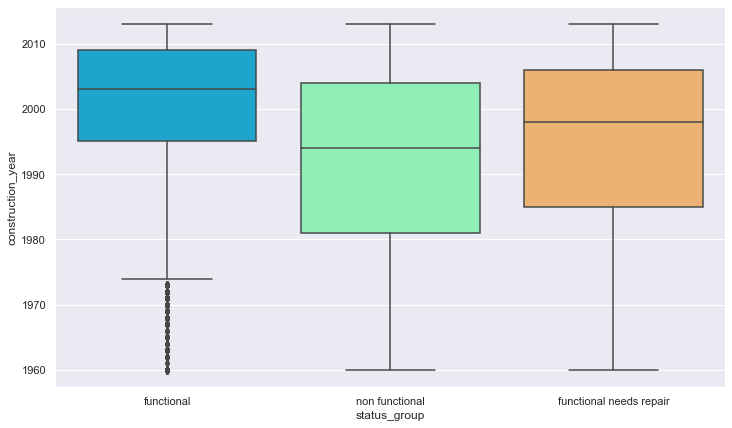

In [ ]:
plt.figure(figsize=(12, 7))
sns.boxplot(x='status_group',y='construction_year',data=df[df.construction_year>0],palette='rainbow')

<AxesSubplot:xlabel='construction_year', ylabel='Density'>

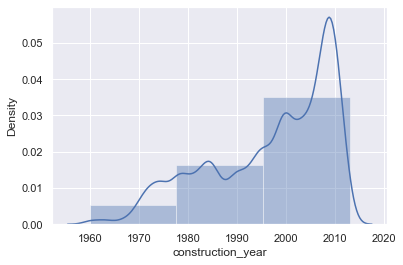

In [ ]:
df1=df[df.construction_year>0]
sns.distplot(df1['construction_year'], bins=3)

In [ ]:
## CONSTRUCTION_YEAR (realizo una variable con 4 rangos y 4 variables con esos mismos rangos)
df_c['construction_year_0'] = df_c['construction_year'].apply(lambda x: 1 if x==0 else 0)
df_c['construction_year_1'] = df_c['construction_year'].apply(lambda x: 1 if x>0 and x<1980 else 0)
df_c['construction_year_2'] = df_c['construction_year'].apply(lambda x: 1 if x>=1980 and x<1995 else 0)
df_c['construction_year_3'] = df_c['construction_year'].apply(lambda x: 1 if x>=1995 else 0)
df_c['construction_year_new'] = df_c['construction_year'].apply(lambda x: 0 if x==0 else (1 if x>0 and x<1980 else(2 if x>=1980 and x<1995 else(3))))  

**Analizando la variable "amount_tsh"**

<AxesSubplot:xlabel='status_group', ylabel='amount_tsh'>

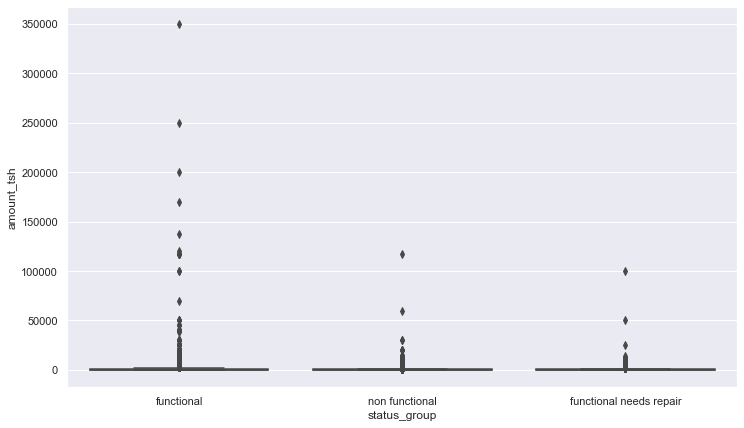

In [ ]:
plt.figure(figsize=(12, 7))
sns.boxplot(x='status_group',y='amount_tsh',data=df[df.amount_tsh>0],palette='rainbow')

([<matplotlib.axis.XTick at 0x12219739788>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

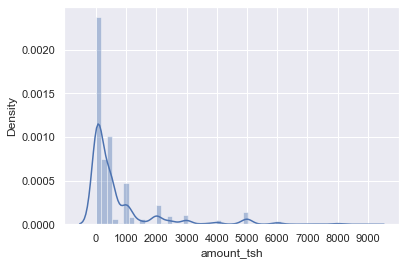

In [ ]:
df2=df[(df.amount_tsh>0) & (df.amount_tsh<10000)]
sns.distplot(df2['amount_tsh'])
plt.xticks(np.arange(0,10000,step =1000))

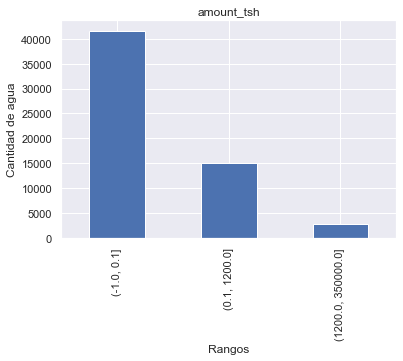

In [ ]:
# Creando segmentos de amount_tsh
amount_tsh_seg = pd.cut(df['amount_tsh'], 
                  [-1, 0.1, 1200, 350000])
# Creando el grafico de barras desde pandas
plot = pd.value_counts(amount_tsh_seg).plot(kind='bar',
                                      title='amount_tsh')
plot.set_ylabel('Cantidad de agua')
plot.set_xlabel('Rangos')
plt.show()

In [ ]:
#AMOUNT_TSH (creo una variable binaria y otra con 3 rangos rangos)
df_c['amount_tsh_bin'] = df_c['amount_tsh'].apply(lambda x: 1 if x>0 else 0)
df_c['amount_tsh_new'] = df_c['amount_tsh'].apply(lambda x: 0 if x==0 else (1 if x>0 and x<=1200 else(2)))

**Analizando la variable "population"**

<AxesSubplot:xlabel='status_group', ylabel='population'>

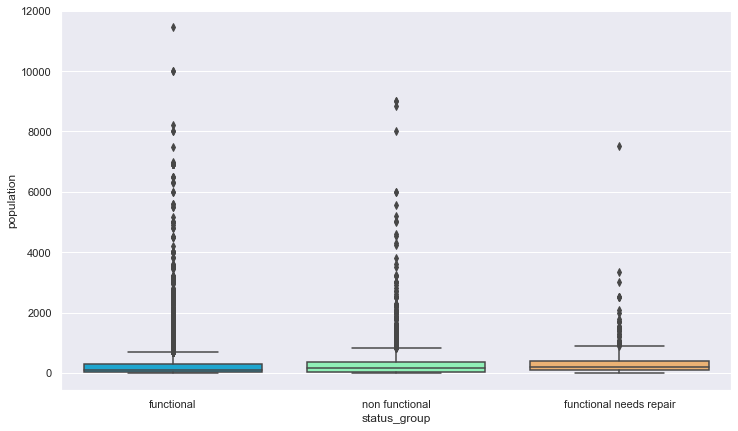

In [ ]:
plt.figure(figsize=(12, 7))
sns.boxplot(x='status_group',y='population',data=df[df.amount_tsh>0],palette='rainbow')

([<matplotlib.axis.XTick at 0x1221638f088>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

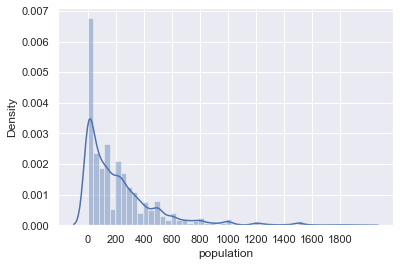

In [ ]:
df3=df[(df.population>0) & (df.population<2000)]
sns.distplot(df3['population'])
plt.xticks(np.arange(0,2000,step =200))

In [ ]:
# POPULATION (creo una variable binaria y otra con 3 rangos
df_c['population_bin'] = df_c['population'].apply(lambda x: 1 if x>0 else 0)
df_c['population_new'] = df_c['population'].apply(lambda x: 0 if x==0 else (1 if x>0 and x<=1000 else(2)))

**Analizando la variable "gps_height"** - - tiene 34.4% de zeros y 2428 valores distintos

<AxesSubplot:xlabel='status_group', ylabel='gps_height'>

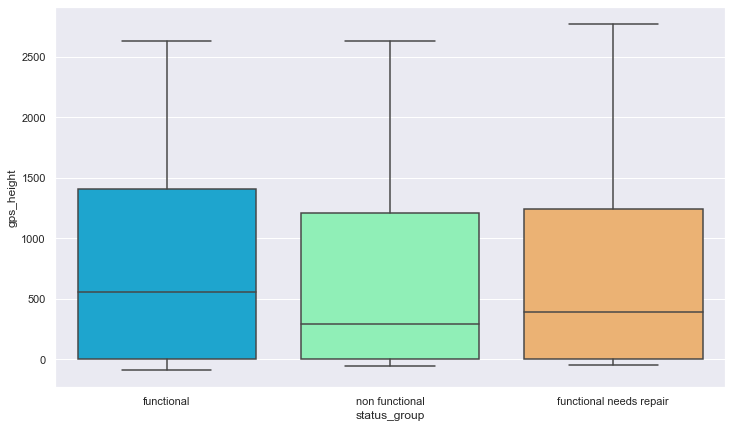

In [ ]:
plt.figure(figsize=(12, 7))
sns.boxplot(x='status_group',y='gps_height',data=df,palette='rainbow')

<AxesSubplot:xlabel='status_group', ylabel='num_private'>

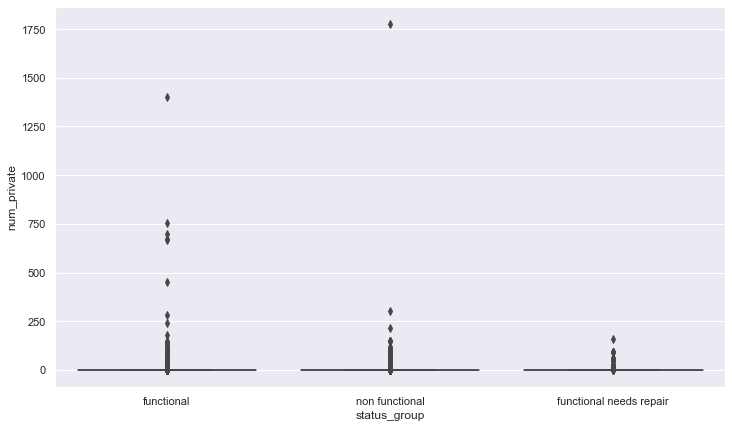

In [ ]:
plt.figure(figsize=(12, 7))
sns.boxplot(x='status_group',y='num_private',data=df,palette='rainbow')

<AxesSubplot:xlabel='gps_height', ylabel='Density'>

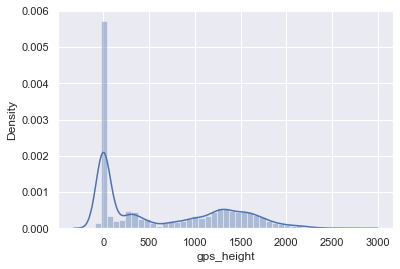

In [ ]:
sns.distplot(df['gps_height'])

In [ ]:
# GPS_HEIGHT (creo una variable binaria y otra con 3 rangos)
df_c['gps_height_bin'] = df_c['gps_height'].apply(lambda x: 1 if x>0 else 0)
df_c['gps_height_new'] = df_c['gps_height'].apply(lambda x: 0 if x<=0 else (1 if x>0 and x<=1300 else(2)))

**District_code**

<AxesSubplot:xlabel='district_code'>

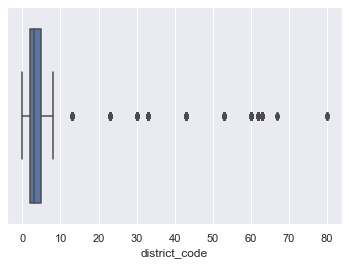

In [ ]:
sns.boxplot(df['district_code'])

([<matplotlib.axis.XTick at 0x12220794408>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

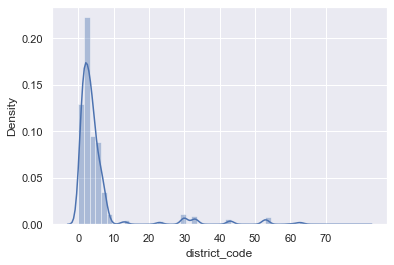

In [ ]:
sns.distplot(df_c['district_code'])
plt.xticks(np.arange(0,80,step =10))

<AxesSubplot:xlabel='status_group', ylabel='district_code'>

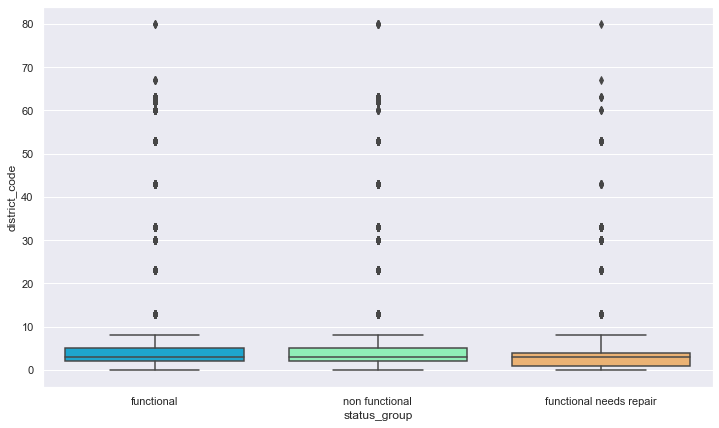

In [ ]:
plt.figure(figsize=(12, 7))
sns.boxplot(x='status_group',y='district_code',data=df,palette='rainbow')

In [ ]:
df.district_code.value_counts()

1     12203
2     11173
3      9998
4      8999
5      4356
6      4074
7      3343
8      1043
30      995
33      874
53      745
43      505
13      391
23      293
63      195
62      109
60       63
0        23
80       12
67        6
Name: district_code, dtype: int64

In [ ]:
# district_code (el codigo 0 paso a , y creo el codigo 10 que reune todos los codigos a partir del 8)
dic_replace = {0: 1,
               30: 10,
               33: 10,
               53: 10,
               43: 10,
               13: 10,
               23: 10,
               63: 10,
               62: 10,
               60: 10,
               80: 10,
               67: 10,}
df_c['district_code'] = df_c['district_code'].map(dic_replace).fillna(df_c['district_code'])
df_c['district_code'] = df_c['district_code'].map(np.int64)
df_c['district_code'].value_counts()

1     15326
2     13929
3     12521
4     11253
5      5428
10     5237
6      5108
7      4166
8      1282
Name: district_code, dtype: int64

**REGION_CODE** - 27 valores distintos

In [ ]:
df.region_code.value_counts()

11    5300
17    5011
12    4639
3     4379
5     4040
18    3324
19    3047
2     3024
16    2816
10    2640
4     2513
1     2201
13    2093
14    1979
20    1969
15    1808
6     1609
21    1583
80    1238
60    1025
90     917
7      805
99     423
9      390
24     326
8      300
40       1
Name: region_code, dtype: int64

<AxesSubplot:xlabel='region_code'>

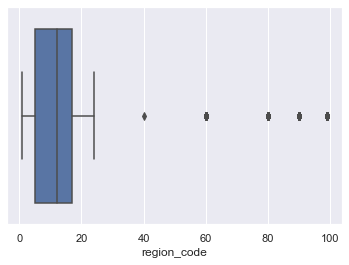

In [ ]:
sns.boxplot(df['region_code'])

<AxesSubplot:xlabel='status_group', ylabel='region_code'>

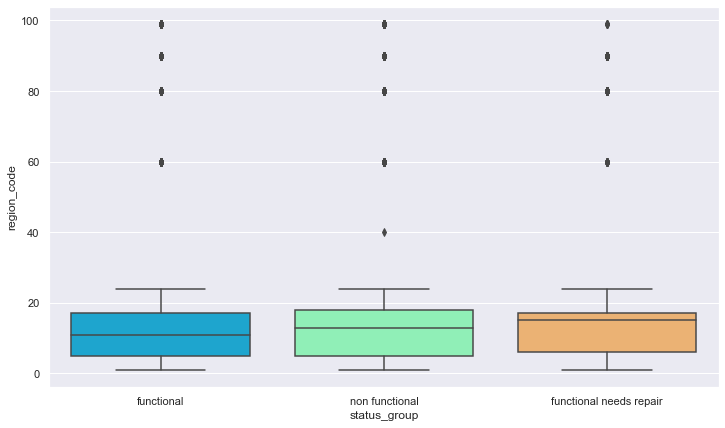

In [ ]:
plt.figure(figsize=(12, 7))
sns.boxplot(x='status_group',y='region_code',data=df,palette='rainbow')

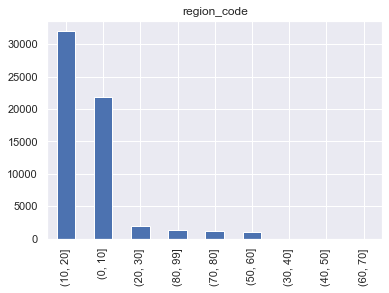

In [ ]:
region_code_seg = pd.cut(df['region_code'], 
                  [0, 10, 20, 30, 40,50,60,70,80,99])
# Creando el grafico de barras desde pandas
plot = pd.value_counts(region_code_seg).plot(kind='bar',
                                      title='region_code')

In [ ]:
# region_code (creo una nueva variable con 3 rangos) 
df_c['region_code_new'] = df_c['region_code'].apply(lambda x: 0 if x>0 and x<=10 else (1 if x>10 and x<=20 else(2)))

In [ ]:
#elimino las variables:
df_c.drop(['date_recorded',
         'scheme_name', #47 % de missings
         'recorded_by', #es constante
         'num_private', #98.7% de ceros
 
         #las variables modificadas:
         'amount_tsh',
         'population',
         'gps_height',
         'construction_year',
         'region_code',
         
         #las variables con multicolinealidad y con peor correlacion con la VariableObj
         'source_type', 
         'waterpoint_type_group',
         'source_class',
         'quantity_group',
         'quality_group',
         'payment_type',
         'management_group',
         'extraction_type_group',
         'extraction_type_class'],
        axis=1, inplace=True)

In [ ]:
#Repito los mismos pasos de antes

col_null=['installer', 'funder', 'subvillage']
for c in col_null:
    random = np.random.choice(df_c[c])
    df_c[c] = df_c[c].fillna(random)
    
col_null_mode=['public_meeting', 'permit', 'scheme_management']
for c in col_null_mode:
    mode = df_c[c].mode()[0]
    df_c[c] = df_c[c].fillna(mode)

df_c.isnull().any().any()

False

In [ ]:
#Variables con muchas categorias transformo con las frecuencias:
CatFrecuencias=['funder','installer','wpt_name','subvillage','lga','ward']

for i in CatFrecuencias:
    frecuencia=df_c[i].value_counts().to_dict()
    df_c[i]=df_c[i].map(frecuencia)

Si alguno de los niveles de una variable cualitativa tiene muy pocas observaciones en comparación a los otros niveles, puede ocurrir que, durante la validación cruzada o bootstrapping, algunas particiones no contengan ninguna observación de dicha clase (varianza cero), lo que puede dar lugar a errores. En estos casos, suele ser conveniente:

- Eliminar las observaciones del grupo minoritario si es una variable multiclase.

- Eliminar la variable si solo tiene dos niveles.

- Agrupar los niveles minoritarios en un único grupo.

- Asegurar que, en la creación de las particiones, todos los grupos estén representados en cada una de ellas.

Para este caso, hay que tener precaución con las variables:

- extraction_type: other - mkulima/shinyanga-2
- waterpoint_type:dam-8
- scheme_management:None-1

In [ ]:
#Se unifica la categoria de 'dam' en una categoria de "cattle trough".
dic_replace = {'dam': "other"}
df_c['waterpoint_type'] = df_c['waterpoint_type'].map(dic_replace).fillna(df_c['waterpoint_type'])

#Se unifica la categoria de 'other - mkulima/shinyanga' en una categoria de "other".
dic_replace = {'other - mkulima/shinyanga': "other"}
df_c['extraction_type'] = df_c['extraction_type'].map(dic_replace).fillna(df_c['extraction_type'])

#Se unifica la categoria de 'None' en una categoria de "Other".
dic_replace = {'None': "other"}
df_c['scheme_management'] = df_c['scheme_management'].map(dic_replace).fillna(df_c['scheme_management'])


#paso a dummies las variables categóricas restantes y compruebo que no haya variables 'object' ni valores faltantes
df_c=pd.get_dummies(df_c, drop_first=True)
print(np.mean(df_c.dtypes != object))
print(df_c.isnull().sum().sum())

1.0
0


In [ ]:
#separo las muestras despues el preprocesado
df_test=df_c.iloc[59400:, :]
df_train=df_c.iloc[:59400, :]
print(df_test.shape,df_train.shape)

(14850, 124) (59400, 124)


In [ ]:
df_train=pd.merge(df_train,df_labels,on='id')
print(df_train.shape)

(59400, 125)


In [ ]:
df_train_merged=df_train.copy()
df_train_merged.status_group.replace(('functional', 'non functional', 'functional needs repair'),(1,0,2),inplace=True)

In [ ]:
corr = abs(df_train_merged.corr())
corr[['status_group']].sort_values(by = 'status_group',ascending = False).style.background_gradient()

,status_group
status_group,1.000000
extraction_type_other,0.269773
waterpoint_type_other,0.268616
quantity_enough,0.203561
amount_tsh_bin,0.175545
extraction_type_gravity,0.169980
amount_tsh_new,0.168172
water_quality_unknown,0.153653
waterpoint_type_communal standpipe,0.146638
payment_pay monthly,0.131293


Vemos que amount_tsh_bin y amount_tsh_new aparecen entre primeros 10 features importantes. Tambien aparece construction_year_3 y 1 entre primeros 20. De otro lado, nuevas variables de population y gps_height no mejoraron igual que region_code y district_code.

In [ ]:
y=df_train['status_group']
df_train.drop('status_group', axis=1, inplace=True)
print(y.shape)

(59400,)


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(df_train, y, test_size = 0.2, random_state = 0, stratify=y)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(47520, 124)
(11880, 124)
(47520,)
(11880,)


In [ ]:
rf_clf = RandomForestClassifier(n_estimators= 300, max_depth= 20, criterion='entropy', random_state=42, bootstrap = True)
rf_clf.fit(X_train,y_train)
rf_clf.score(X_test,y_test) 

0.803956228956229

In [ ]:
y_pred= rf_clf.predict(X_test)

saca_metricas(y_test, y_pred)

matriz de confusión
[[5817  121  514]
 [ 454  266  143]
 [1040   57 3468]]
accuracy
0.803956228956229
precision
[0.79565039 0.5990991  0.84072727]
recall
[0.90158091 0.30822711 0.75969332]
f1
[0.84530989 0.40703902 0.7981588 ]


El resultado de accuracy es peor por eso voy a elegir lo que implemento en feature engineering

## FEATURE ENGINEERING Final

In [ ]:
df_c = pd.concat([df_bombas,df_bombas_test])
print(df_c.shape)
#transformo la varible "date_recorded" en tres variables: año, mes y dia
df_c['month'] = pd.to_datetime(df_c['date_recorded']).dt.month.apply(str)
df_c['year'] = pd.to_datetime(df_c['date_recorded']).dt.year.apply(str)
df_c['day'] = pd.to_datetime(df_c['date_recorded']).dt.day.apply(str)

#paso las variables de las fechas a numéricas
df_c['month']=pd.to_numeric(df_c['month'])
df_c['year']=pd.to_numeric(df_c['year'])
df_c['day']=pd.to_numeric(df_c['day'])

#creo una variable de distancia a partir de la longitud y latitud 
df_c['dist']=np.sqrt(df_c['longitude']**2+df_c['latitude']**2)

## CONSTRUCTION_YEAR (realizo una variable con 4 rangos y 4 variables con esos mismos rangos)
df_c['construction_year_0'] = df_c['construction_year'].apply(lambda x: 1 if x==0 else 0)
df_c['construction_year_1'] = df_c['construction_year'].apply(lambda x: 1 if x>0 and x<1980 else 0)
df_c['construction_year_2'] = df_c['construction_year'].apply(lambda x: 1 if x>=1980 and x<1995 else 0)
df_c['construction_year_3'] = df_c['construction_year'].apply(lambda x: 1 if x>=1995 else 0)
#df_c['construction_year_new'] = df_c['construction_year'].apply(lambda x: 0 if x==0 else (1 if x>0 and x<1980 else(2 if x>=1980 and x<1995 else(3))))

#AMOUNT_TSH (creo una variable binaria y otra con 3 rangos rangos)
df_c['amount_tsh_bin'] = df_c['amount_tsh'].apply(lambda x: 1 if x>0 else 0)
#df_c['amount_tsh_new'] = df_c['amount_tsh'].apply(lambda x: 0 if x==0 else (1 if x>0 and x<=1200 else(2)))

#df_c['prop_missings']=df_c.isnull().mean(axis=1)

# region_code (creo una nueva variable con 3 rangos) 
#df_c['region_code_new'] = df_c['region_code'].apply(lambda x: 0 if x>0 and x<=10 else (1 if x>10 and x<=20 else(2)))



(74250, 39)


In [ ]:
#elimino las variables:
df_c.drop(['date_recorded',
         'scheme_name', #47 % de missings
         'recorded_by', #es constante
         'num_private', #98.7% de ceros
          
         #las variables modificadas:
         #'amount_tsh',
         #'construction_year',
         #'region_code',
           
         #las variables con multicolinealidad y con peor correlacion con la VariableObj
         'source_type', 
         'waterpoint_type_group',
         'source_class',
         'quantity_group',
         'quality_group',
         'payment_type',
         'management_group',
         'extraction_type_group',
         'extraction_type_class'],
        axis=1, inplace=True)

In [ ]:
col_null=['installer', 'funder', 'subvillage']
for c in col_null:
    random = np.random.choice(df_c[c])
    df_c[c] = df_c[c].fillna(random)
    
# Completando valores faltantes de datos categóricos por mode
col_null_mode=['public_meeting', 'permit', 'scheme_management']
for c in col_null_mode:
    mode = df_c[c].mode()[0]
    df_c[c] = df_c[c].fillna(mode)
    
df_c.isnull().any().any()

False

In [ ]:
#Variables con muchas categorias transformo con las frecuencias:
CatFrecuencias=['funder','installer','wpt_name','subvillage','lga','ward']

for i in CatFrecuencias:
    frecuencia=df_c[i].value_counts().to_dict()
    df_c[i]=df_c[i].map(frecuencia)

#paso a dummies las variables categóricas restantes y compruebo que no haya variables 'object' ni valores faltantes
df_c=pd.get_dummies(df_c, drop_first=True)
print(np.mean(df_c.dtypes != object))
print(df_c.isnull().sum().sum())

1.0
0


In [ ]:
#separo las muestras despues el preprocesado
df_test=df_c.iloc[59400:, :]
df_train=df_c.iloc[:59400, :]
print(df_test.shape,df_train.shape)

(14850, 124) (59400, 124)


In [ ]:
df_train=pd.merge(df_train,df_labels,on='id')
print(df_train.shape)

(59400, 125)


In [ ]:
y=df_train['status_group']
df_train.drop('status_group', axis=1, inplace=True)
print(y.shape)

(59400,)


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(df_train, y, test_size = 0.2, random_state = 0, stratify=y)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(47520, 124)
(11880, 124)
(47520,)
(11880,)


In [ ]:
rf_clf = RandomForestClassifier(n_estimators= 300, max_depth= 20, criterion='entropy', random_state=42, bootstrap = True)
rf_clf.fit(X_train,y_train)
rf_clf.score(X_test,y_test) 

0.8132154882154882

In [ ]:
y_pred= rf_clf.predict(X_test)

saca_metricas(y_test, y_pred)

matriz de confusión
[[5879  111  462]
 [ 465  267  131]
 [ 994   56 3515]]
accuracy
0.8132154882154882
precision
[0.80117198 0.61520737 0.85564752]
recall
[0.91119033 0.30938586 0.76998905]
f1
[0.85264685 0.41171935 0.81056151]


Al intentar varias combinaciones de feature engineering no llegué a mejorar la capacidad predictiva del modelo. 

He probado la seleccion de variables con chi cuadrado(sacando 2 columnas con datos negativos), pero el modelo de random forest pierde en accuracy. 

In [ ]:
prediccion=rf_clf.predict(df_test)
Predicciones5 = pd.DataFrame({'id':df_test.index, 'status_group':prediccion})
Predicciones5.to_csv(r'Predicciones5.csv',index=False)